This notebook plots RIB correlation with neurons. RIB cross correlation w.r.t. other neurons and finally scatter plots of neurites and RIB

In [1]:
import h5py
import numpy as np
import Functions.Binning as Bin
import Functions.Regressors as Rss
import copy
import importlib
import matplotlib.pyplot as plt
import Functions.AllFunctions as AllF
import Functions.Make_pandaBinsDataset as MPB
import pandas as pd
import Functions.UnifyWormsFun as UNF
from scipy.signal import find_peaks
import Functions.Autocorr as Aut
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

/mnt/DATA/Mahsa/movies/LongRecordings/codes/Cluster


In [2]:
h5 = h5py.File('MegaData7_7worms_V5.h5', 'r')#h5py.File('MegaData7_7worms_V2_correctLRorder.h5', 'r')
outDir = '/mnt/DATA/Mahsa/movies/LongRecordings/Plotting/Plot/RIB/'# directory of the output files

In [3]:
L= h5['data_sets_info/lowercam_length']
n_title = [s.decode('utf-8') for s in list(h5['data_sets_info/neuron_names'])]
MegaData0 = np.copy(h5['data/dataraw'])
MegaData =copy.deepcopy(MegaData0)

In [4]:
smooth=True
gapfilled = True
numW=7


In [5]:
#the upper camera in the  6th movie starts late
for i in range(55):
    if i >12 and not (i in [27,28,39,40]):
        MegaData[5,:243,i] = 0
        MegaData0[5,:243,i] = 0

for i in range(55):
    MegaData[6,L[6]:,i] = 0
    MegaData0[6,L[6]:,i] = 0

In [6]:
sm = [2,2,2,3,4,3,3]
g=[5,5,5,7,10,7,7]
if smooth:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData[d,:L[d],i] = Bin.smooth_vec_long(MegaData0[d,:L[d],i],sm[d],g[d])

MegaData_filled =copy.deepcopy(MegaData0)
importlib.reload(AllF)
if gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_filled[d,:L[d],i] = AllF.fill_in_gaps(MegaData0[d,:L[d],i],g[d])

MegaData_fs =copy.deepcopy(MegaData0)
if smooth and gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_fs[d,:L[d],i] = Bin.smooth_vec_long(MegaData_filled[d,:L[d],i],sm[d],g[d])


MegaData_filled[MegaData_filled==0] = np.nan
MegaData_interp = copy.deepcopy(MegaData_filled)
for d in range(numW):
    for n in range(55):
        if not (n in [10,11,12]):
            time = MegaData0[d,:L[d],12]
            values = MegaData_filled[d,:L[d],n]
            df = pd.DataFrame({'time': time, 'values': values})
            window_size = 3
            df['values2'] = df['values'].interpolate(method='linear')
            smoothed_values1 = savgol_filter(df['values2'], window_length=5, polyorder=1)
            df['smoothed_values1'] = smoothed_values1
            MegaData_interp[d,:L[d],n] = smoothed_values1


MegaData_interp[np.isnan(MegaData_interp)]=0
MegaData_filled[np.isnan(MegaData_filled)]=0

In [7]:
##correct odor labels:
#intervals of IAA and nonanone
IAA_int = np.zeros((numW,4))
NN_int = np.zeros((numW,4))
IAA_int[0,:] = [210,690,1775,2255]
IAA_int[1,:] = [210,690,1775,2255]
IAA_int[2,:] = [210,690,1775,2255]
IAA_int[3,:] = [210,690,1775,2255]
IAA_int[4,:] = [1,500,1575,2055]
NN_int[0,:] = [997,1477,2555,3040]
NN_int[1,:] = [997,1477,2555,3040]
NN_int[2,:] = [997,1477,2555,3040]
NN_int[3,:] = [997,1477,2555,3040]
NN_int[4,:] = [797,1277,2350,2840]
NN_int[5,:] = [957,1437,2520,3000]
IAA_int[5,:] = [177,657,1737,2240]
NN_int[6,:] = [1080,1560,2560,3000]
IAA_int[6,:] = [300,780,1780,2260]


In [8]:
%matplotlib widget
Neur_lableAll = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.',"nrDL","loopL","nrDR","loopR","nrVL","nrVR"]
neu_ind = [0,1,2,3,4,5,6,7,8,27,28,39,40]
WormLabel = ['W0','W1','W2','W3','W4','W5','W6']
res = 300# resolution of the images you save

In [9]:
worms_to_select = [0,1,3,4,5,6] 
WormLabel_sub = [WormLabel[i] for i in worms_to_select]

## Plot correlations of all neurons/neurite with a single neuron `n_ref`
### choose `n_ref = 6` for sensory and `n_ref = 4 or 5` for RIBL and RIBR respectively
### If you want to compute correlations only on a subset of the data during IAA and Nonanone series uncomment line 20 to 23.

In [42]:
# compute correlations
n_tit = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR"]
numWorms = 7
n_ref =4#
Correlations_v16 = np.zeros((numWorms,len(Neur_lableAll)))

for d in range(numWorms):
    st=0
    end=L[d]
    for n in range(len(Neur_lableAll)):
        neu = neu_ind[n]
        if d>0 or not(n in [3,5]):
            secI0 = 0#AllF.closest_index(MegaData[d,:,12],IAA_int[d,0])
            secI1 = L[d]#AllF.closest_index(MegaData[d,:,12],IAA_int[d,1])
            secN0 = 0#AllF.closest_index(MegaData[d,:,12],NN_int[d,0])
            secN1 = L[d]#AllF.closest_index(MegaData[d,:,12],NN_int[d,1])
            '''
            secI0 = AllF.closest_index(MegaData[d,:,12],IAA_int[d,0])
            secI1 = AllF.closest_index(MegaData[d,:,12],IAA_int[d,1])
            secN0 = AllF.closest_index(MegaData[d,:,12],NN_int[d,0])
            secN1 = AllF.closest_index(MegaData[d,:,12],NN_int[d,1])
            '''
            Act = np.concatenate((MegaData[d,secI0:secI1,neu], MegaData[d,secN0:secN1,neu]))#copy.deepcopy(MegaData[d,st:L[d],neu])
            V = np.concatenate((MegaData[d,secI0:secI1,n_ref], MegaData[d,secN0:secN1,n_ref]))
            Correlations_v16[d,n],x = AllF.compute_2rows(AllF.compute_vector_z_score(Act),V)

In [43]:
# compute maximum correlation between left and right pairs
MaxMat = np.zeros((Correlations_v16.shape[0],7))
for d in range(Correlations_v16.shape[0]):
    a = Correlations_v16[d,:2]
    MaxMat[d,0] = a[np.argmax(np.abs(a))]
    a = Correlations_v16[d,2:4]
    MaxMat[d,1] = a[np.argmax(np.abs(a))]
    a = Correlations_v16[d,4:6]
    MaxMat[d,2] = a[np.argmax(np.abs(a))]
    MaxMat[d,3] = Correlations_v16[d,6]
    a = Correlations_v16[d,[7,9]]
    MaxMat[d,4] = a[np.argmax(np.abs(a))]
    a = Correlations_v16[d,[8,10]]
    MaxMat[d,5] = a[np.argmax(np.abs(a))]
    a = Correlations_v16[d,11:]
    MaxMat[d,6] = a[np.argmax(np.abs(a))]

MaxNeu = ["RIA","RIM","RIB",'Sens.',"nrD","loop","nrV"]

### plot correlations of RIB with all neurons/neurites (`n_ref=4`)

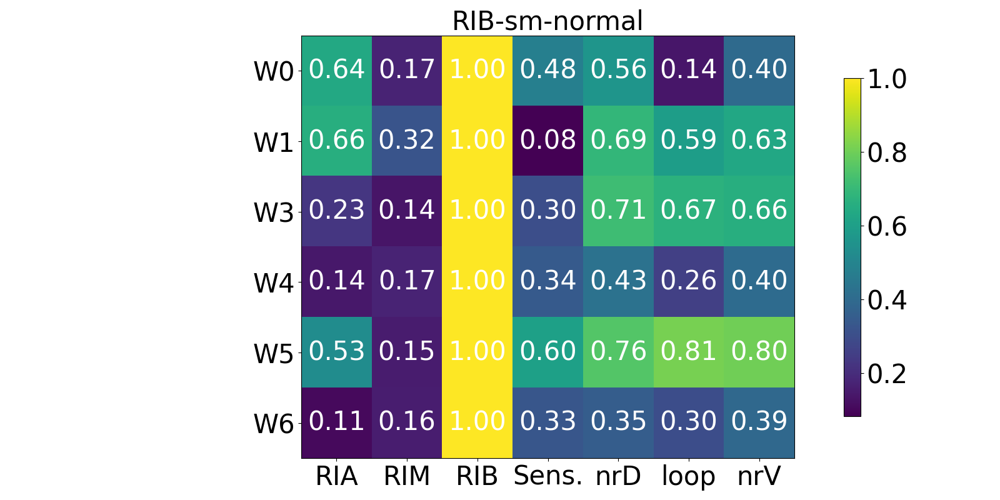

In [44]:
fs=30
Set = 'RIB-sm-normal'

fig = plt.figure(figsize=(16, 8))
ax = fig.gca()
matrices = MaxMat[worms_to_select,:]

im = ax.imshow(matrices, cmap='viridis', aspect='equal')

# Add values to the heatmap
for row in range(matrices.shape[0]):
    for col in range(matrices.shape[1]):
        value = matrices[row, col]
        ax.text(col, row, f'{value:.2f}', ha='center', va='center', color='white', fontsize=fs)


ax.set_title(Set, fontsize=fs)
ax.set_xticks(range(matrices.shape[1]))
ax.set_yticks(range(matrices.shape[0]))
ax.set_xticklabels(MaxNeu, fontsize=fs)
ax.set_yticklabels(WormLabel_sub, fontsize=fs)
#ax.set_ylabel('window 10-20')

# Add a colorbar
cbar = fig.colorbar(im, ax=ax, location='right', shrink=0.8, pad=0.05)
cbar.ax.tick_params(labelsize=fs)
plt.tight_layout()
fig.savefig(f"{outDir}{Set}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{Set}.png", dpi=res, bbox_inches='tight')
plt.show()

### plot correlations of RIB with all neurons/neurites (`n_ref=4`). Left and right pairs separated

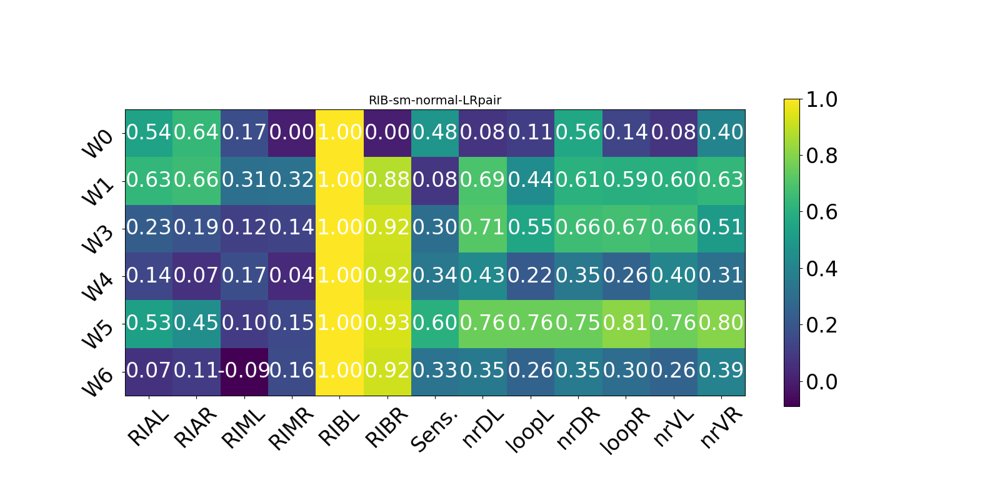

In [45]:
fs=24
Set = 'RIB-sm-normal-LRpair'

fig = plt.figure(figsize=(16, 8))
ax = fig.gca()
matrices = Correlations_v16[worms_to_select,:]

im = ax.imshow(matrices, cmap='viridis', aspect='equal')

# Add values to the heatmap
for row in range(matrices.shape[0]):
    for col in range(matrices.shape[1]):
        value = matrices[row, col]
        ax.text(col, row, f'{value:.2f}', ha='center', va='center', color='white', fontsize=fs)


ax.set_title(Set, fontsize=14)
ax.set_xticks(range(matrices.shape[1]))
ax.set_yticks(range(matrices.shape[0]))
ax.set_xticklabels(Neur_lableAll, fontsize=fs,rotation=45)
ax.set_yticklabels(WormLabel_sub, fontsize=fs,rotation=45)
#ax.set_ylabel('window 10-20')

# Add a colorbar
cbar = fig.colorbar(im, ax=ax, location='right', shrink=0.8, pad=0.05)
cbar.ax.tick_params(labelsize=fs)
#plt.tight_layout()
fig.savefig(f"{outDir}{Set}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{Set}.png", dpi=res, bbox_inches='tight')
plt.show()

### Bar plots of `n_ref` correlations with all neurons

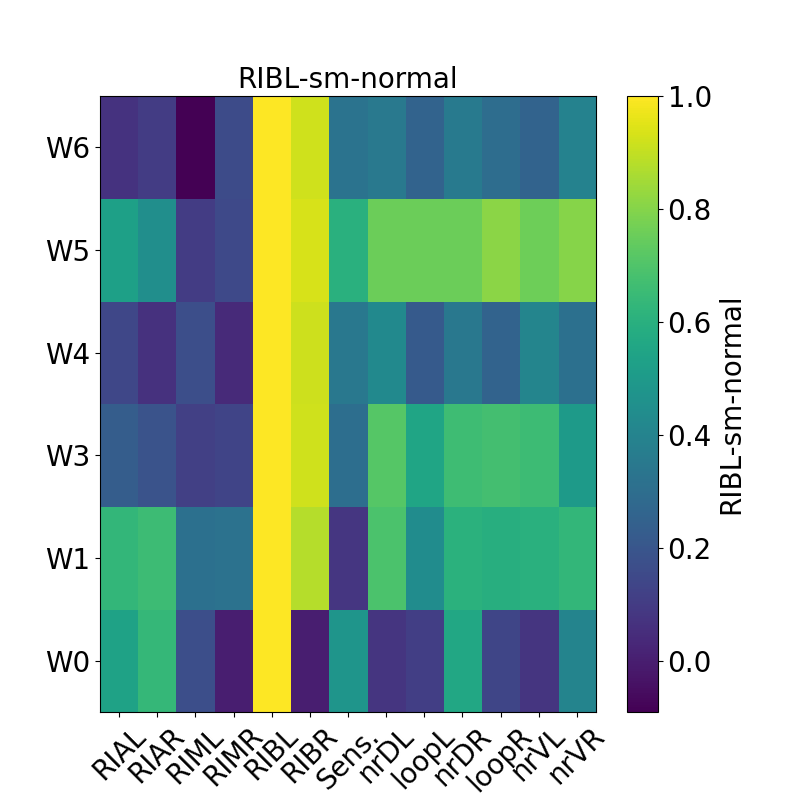

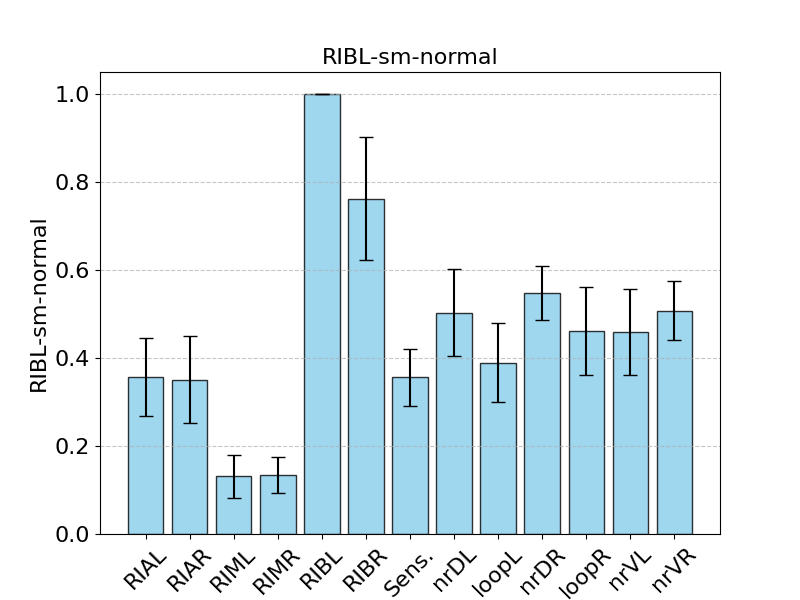

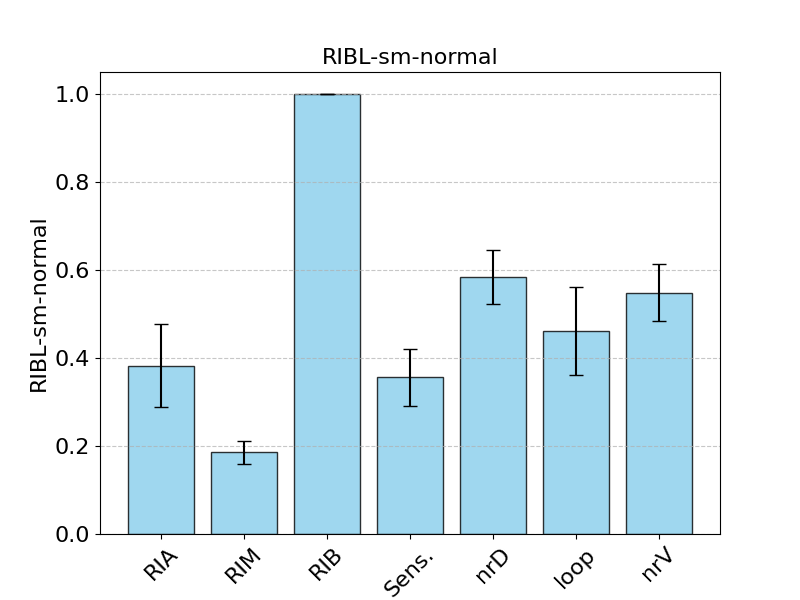

In [46]:

Lab = Neur_lableAll[n_ref]
titre = Lab+'-sm-normal'
fig = Aut.plot_parameters_heat(Correlations_v16[worms_to_select,:],Neur_lableAll, WormLabel_sub ,
                               paramName=titre,fs = 20,titre = Lab+'-sm-normal')
fig.savefig(f"{outDir}{titre}_heat.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{titre}_heat.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(Correlations_v16[worms_to_select,:],Neur_lableAll, paramName=Lab+'-sm-normal',fs =16,r=45)
fig.savefig(f"{outDir}{titre}_barLR.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{titre}_barLR.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(MaxMat[worms_to_select,:],MaxNeu, paramName=Lab+'-sm-normal',fs =16,r=45)
fig.savefig(f"{outDir}{titre}_barmax.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{titre}_barmax.png", dpi=res, bbox_inches='tight')

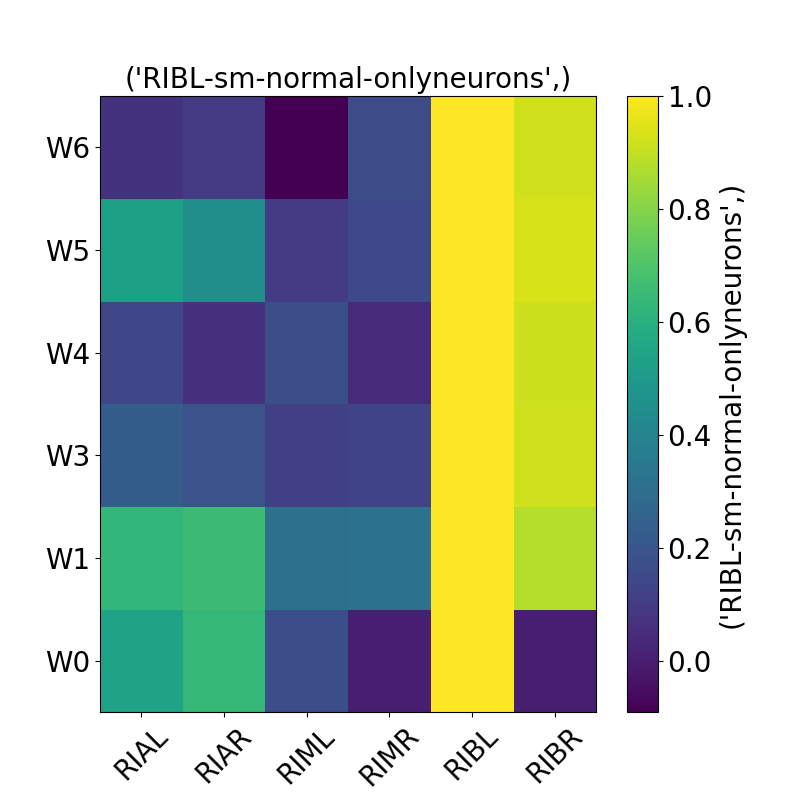

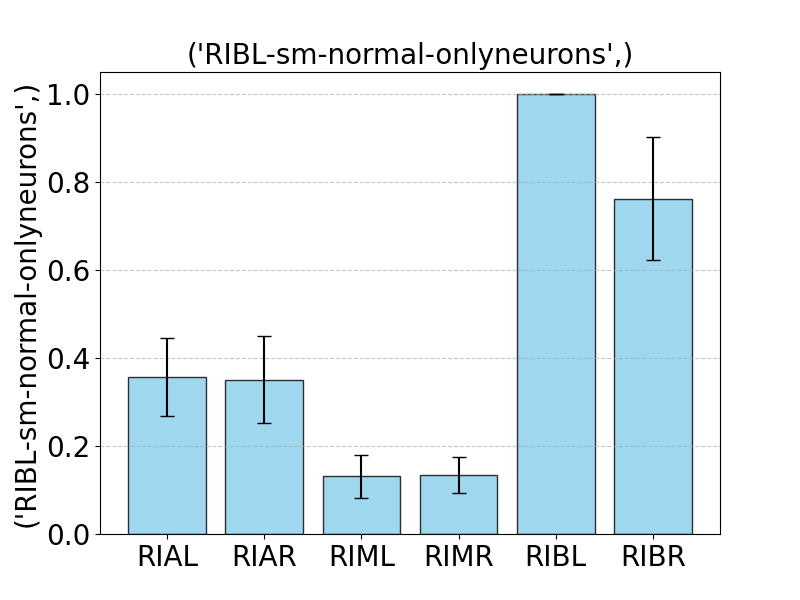

In [47]:
Lab = Neur_lableAll[n_ref]
titre0 = Lab+'-sm-normal-onlyneurons',
fig = Aut.plot_parameters_heat(Correlations_v16[worms_to_select,:6],Neur_lableAll[:6], WormLabel_sub , 
                         paramName=titre0,fs = 20,titre =titre0)
fig.savefig(f"{outDir}{titre0}_ht.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{titre0}_ht.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(Correlations_v16[worms_to_select,:6],Neur_lableAll[:6], paramName=titre0,fs = 20)
fig.savefig(f"{outDir}{titre0}_bar.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}{titre0}_bar.png", dpi=res, bbox_inches='tight')

### Scatter plots of `n_ref` activity vs. neurite or neuron `n` with linear fit and data points colored based on their odor label.

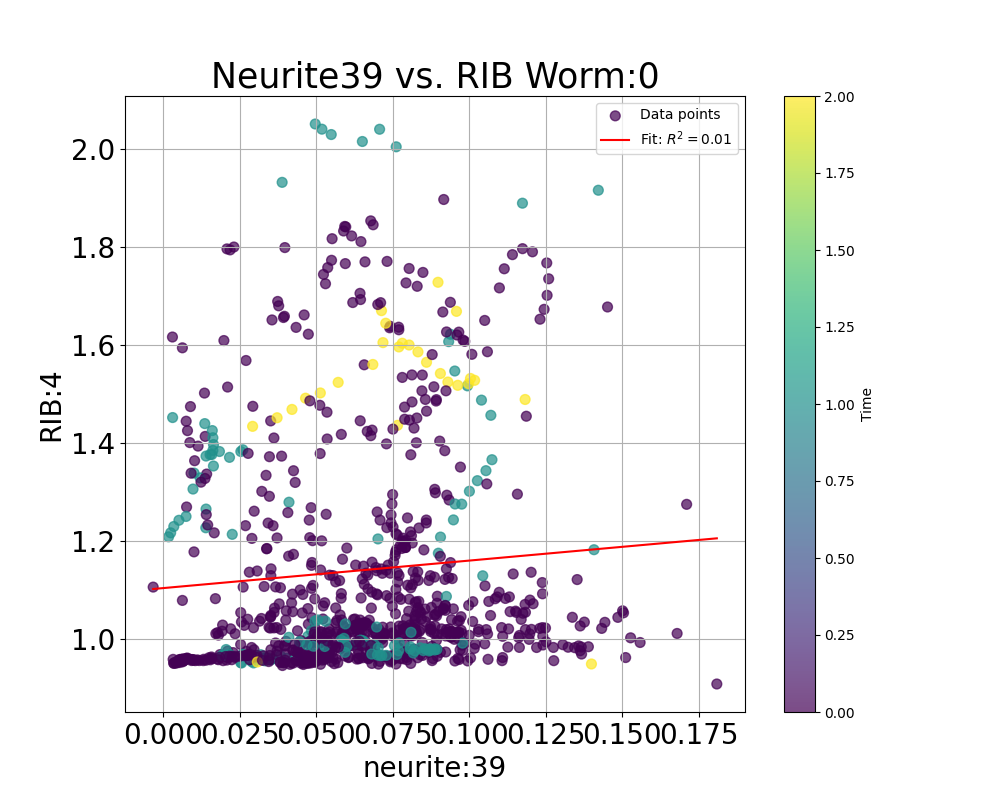

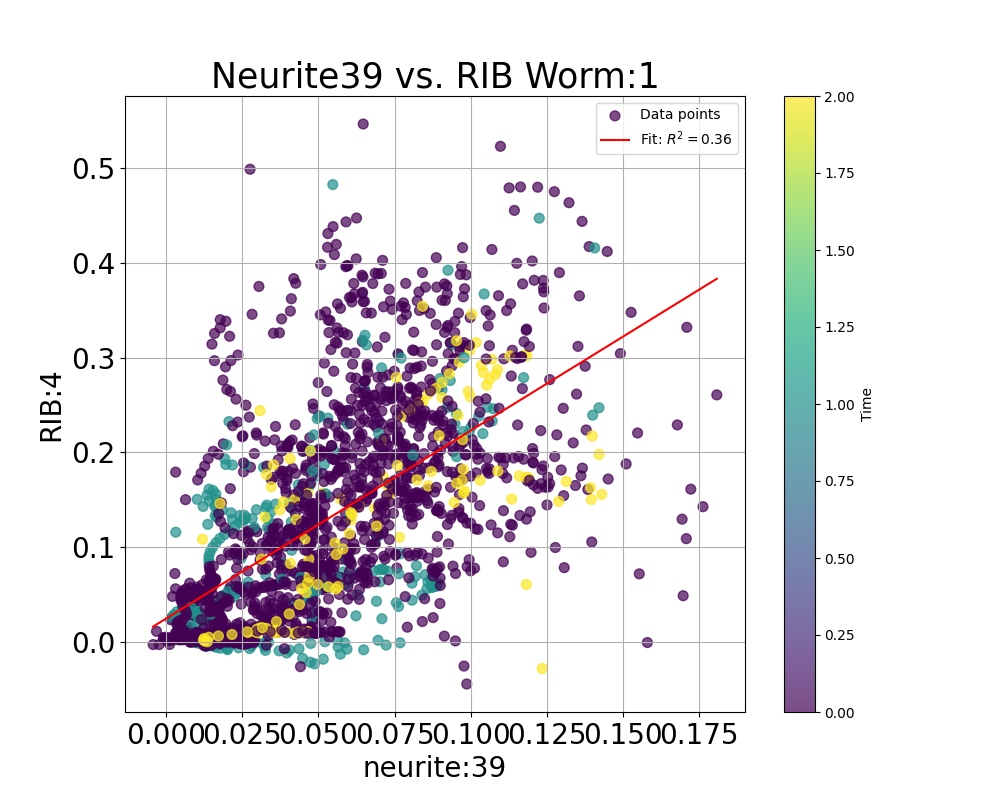

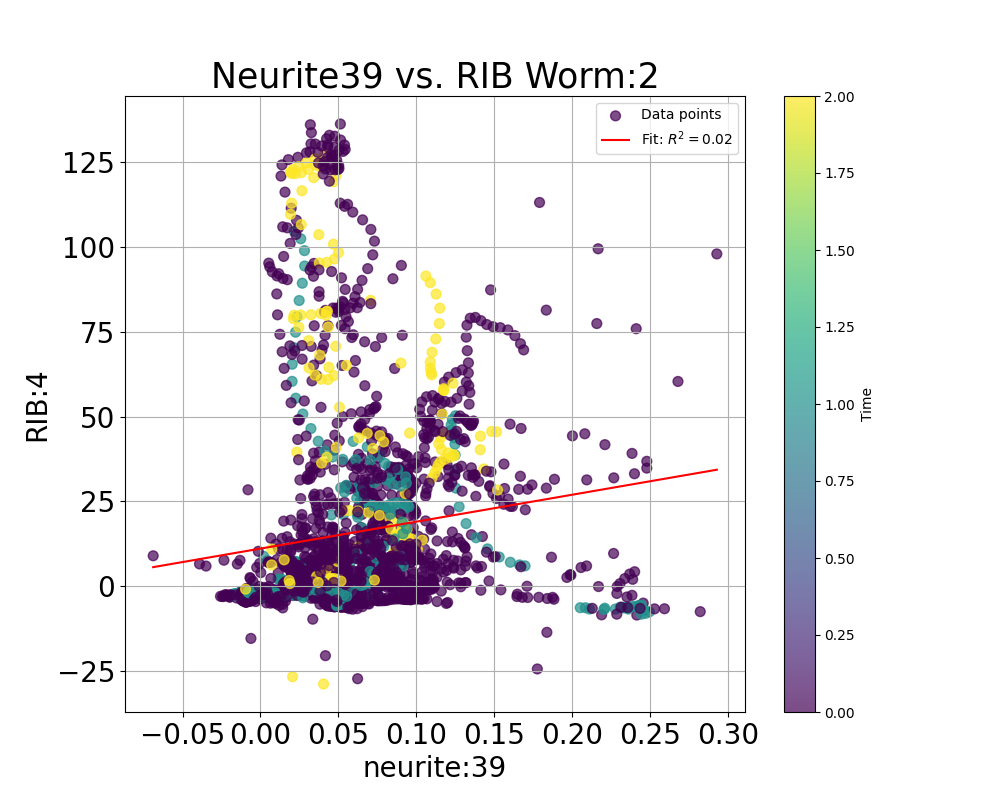

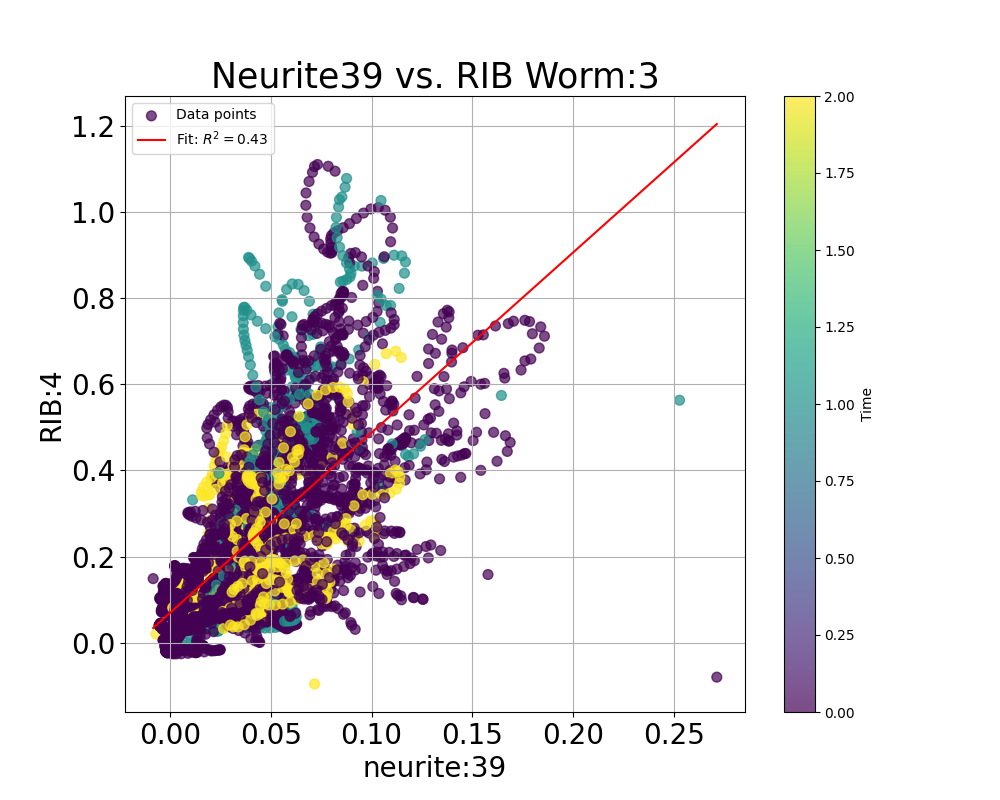

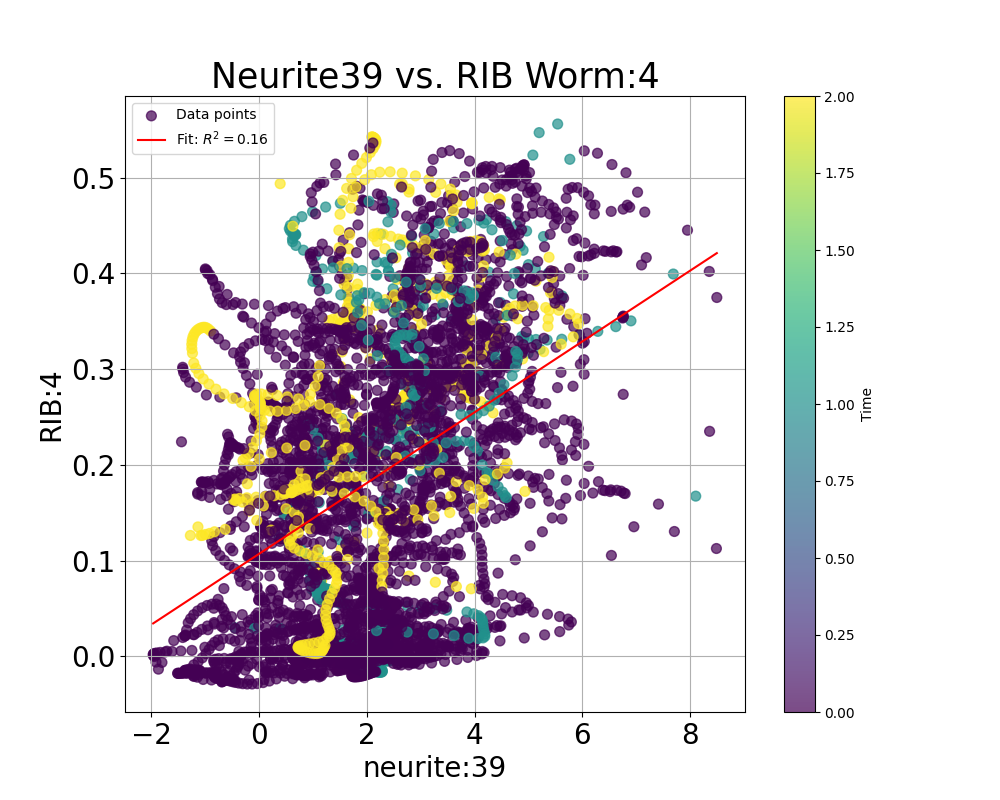

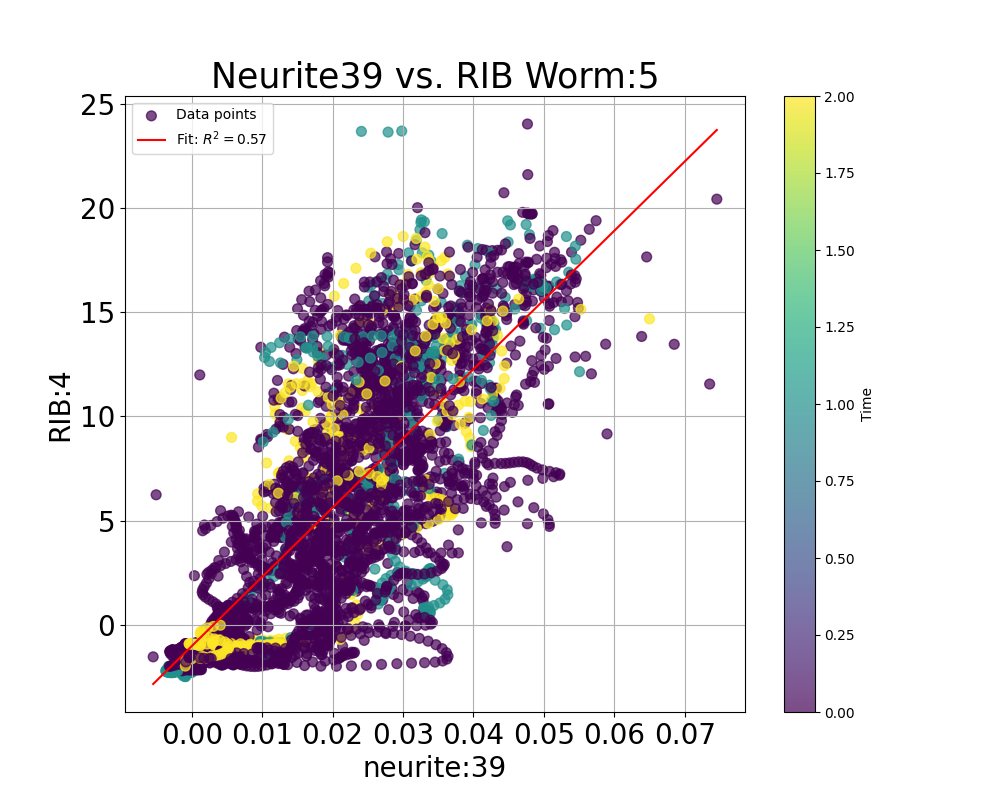

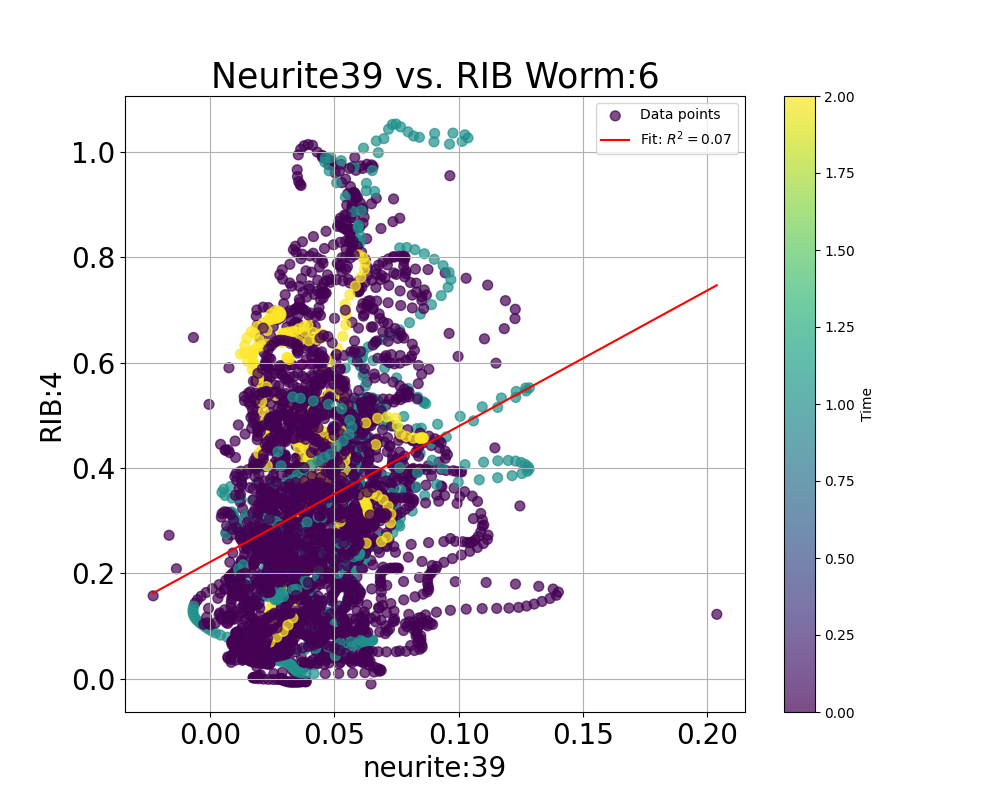

In [48]:


importlib.reload(AllF)
nchoice = n_ref
n=39
numW=7
Set1 = f'Neurite{n} vs. RIB'#'RIMvsRIB-IAA2'
for d in range(numW):
    st = 0
    end = L[d] 
    V = copy.deepcopy(MegaData[d,st:end,nchoice])
    V[np.isinf(V)]=0
    V[np.isnan(V)]=0
    Act = copy.deepcopy(MegaData[d,st:end,n])
    fig = AllF.plot_scatter_with_fit(Act, V, MegaData0[d,st:end,10],xlab="neurite:"+str(n),ylab="RIB:"+str(nchoice),
                                     titre= Set1 +' Worm:'+str(d))

    fig.savefig(f"{outDir}{Set1}_scatter_W{d}.pdf", dpi=res, bbox_inches='tight')
    fig.savefig(f"{outDir}{Set1}_scatter_W{d}.png", dpi=res, bbox_inches='tight')

## Compute cross correlations of all neurons with RIB `n2 = 4` or sensory neuron `n2 = 6`

In [10]:
neuT = [0,1,2,3,4,5,6,7,8,27,28,39,40]#[41,42,43,45,46,47,48]
MegaData[np.isnan(MegaData)]=0

In [11]:
importlib.reload(Aut)
n2=4
FullLags,FullAutocorr,peaks = Aut.get_all_cross(MegaData[:7,:,neuT],n2,L,MegaData0[:7,:,12],neurite=True)


/mnt/DATA/Mahsa/movies/LongRecordings/codes/Cluster/Functions/Autocorr.py:179: RuntimeWarning: Mean of empty slice
  x = (signal1-np.nanmean(signal1))/np.nanstd(signal1)
/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [14]:
# get the results for right RIB, exclude worm 0
n3=5
FullLagsR,FullAutocorrR,peaksR = Aut.get_all_cross(MegaData[1:7,:,neuT],n3,L,MegaData0[1:7,:,12],neurite=True)

### Plot cross correlation of all neurons and neurites with `n2` and mark the peak

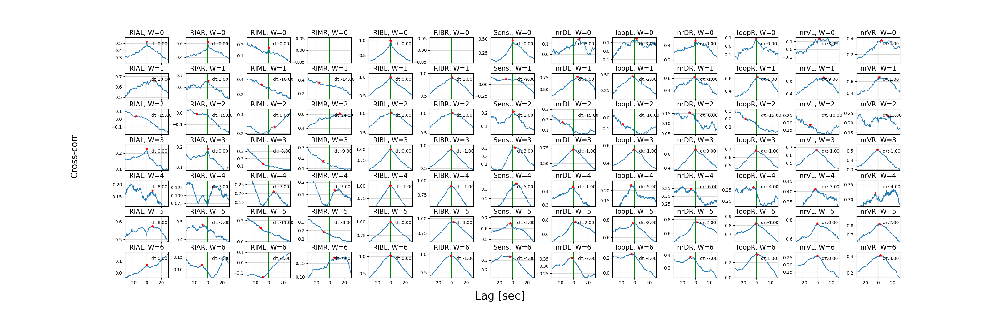

In [13]:
fig, axes = plt.subplots(numW, len(neuT), figsize=(int(len(neuT)*2.5), 10), sharex=True)#, sharey=True)
fig.subplots_adjust(hspace=0.4, wspace=0.4)
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.',"nrDL","loopL","nrDR","loopR","nrVL","nrVR"]
peakMat = np.zeros((numW,len(neuT)))
peakMatWeight = np.zeros((numW,len(neuT)))
peakMat[peakMat==0] = np.nan
peakMatWeight[peakMatWeight==0] = np.nan

for n in range(len(neuT)):
    for d in range(numW):
        ax = axes[d, n]  # Access the subplot

        neu = neuT[n]
        laglen = 2*L[d]-1
        peakAll = peaks[d,n,:]
        pvec = peakAll[~np.isnan(peakAll)]
        
        p = [int(k) for k in pvec]

        # Plot scatter and fitted curve
        ax.axvline(0,color='green')
        ax.plot(FullLags[d,:laglen,n], FullAutocorr[d,:laglen,n])#,zorder=1)
        #ax.scatter(FullLags[d,p,n], FullAutocorr[d,p,n],marker = '*', color='green', label="Peaks",zorder=2)
        
        # Add titles and grid
        ax.set_title(Neur_lab[n]+f", W={d}", fontsize=15)
        ax.grid(alpha=0.5)
        lim = 30
        if len(p)>0:
            ax.set_ylim(np.nanmin(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]), np.nanmax(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]*1.1))
            ax.set_xlim(-lim, lim)
            p0 = np.argmax(FullAutocorr[d,p,n],0)#AllF.closest_index(FullLags[d,p,n],0)
            tau_value = FullLags[d,p[p0],n]
            peakMat[d,n] = tau_value
            peakMatWeight[d,n] = FullLags[d,p[p0],n]*FullAutocorr[d,p[p0],n]
            ax.scatter(FullLags[d,p[p0],n], FullAutocorr[d,p[p0],n],marker = '*', color='red', label="Peaks",zorder=2)
            ax.text(0.6, 0.7, f"dτ:{tau_value:.2f}", transform=ax.transAxes, fontsize=10, color="black",zorder=3)
        #Remove ticks for better readability
        #ax.tick_params(axis='both', which='major', labelsize=15)

# Set shared labels
fig.text(0.5, 0.04, 'Lag [sec]', ha='center', fontsize=25)
fig.text(0.07, 0.5, 'Cross-corr', va='center', rotation='vertical', fontsize=20)
fig.savefig(f"{outDir}CrossCorr_with_neu{n2}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}CrossCorr_with_neu{n2}.png", dpi=res, bbox_inches='tight')

### Plot neurons delay with RIB or sensory neuron `n2= 4 or 6`

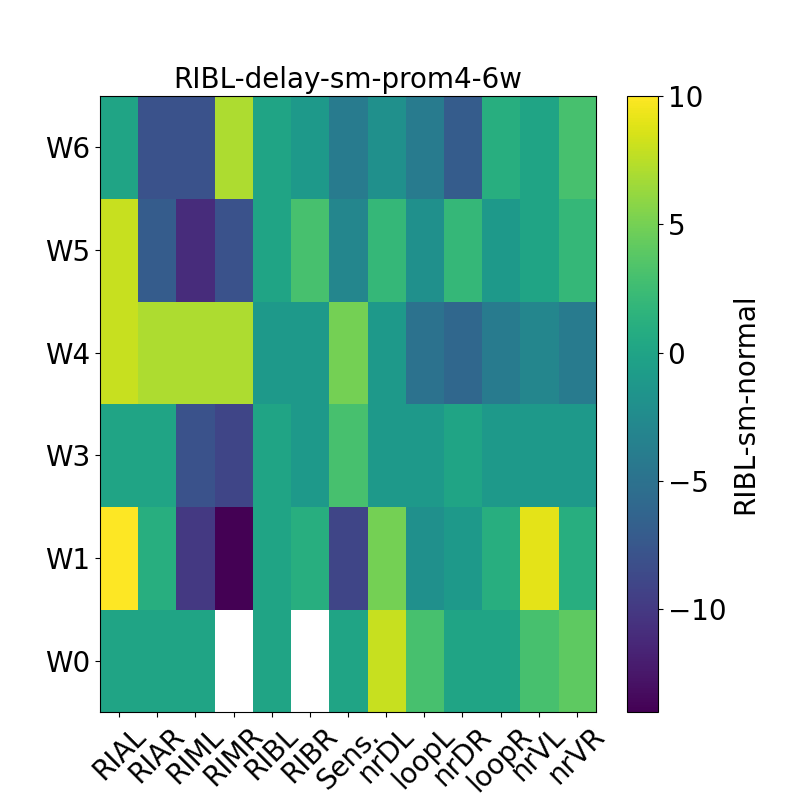

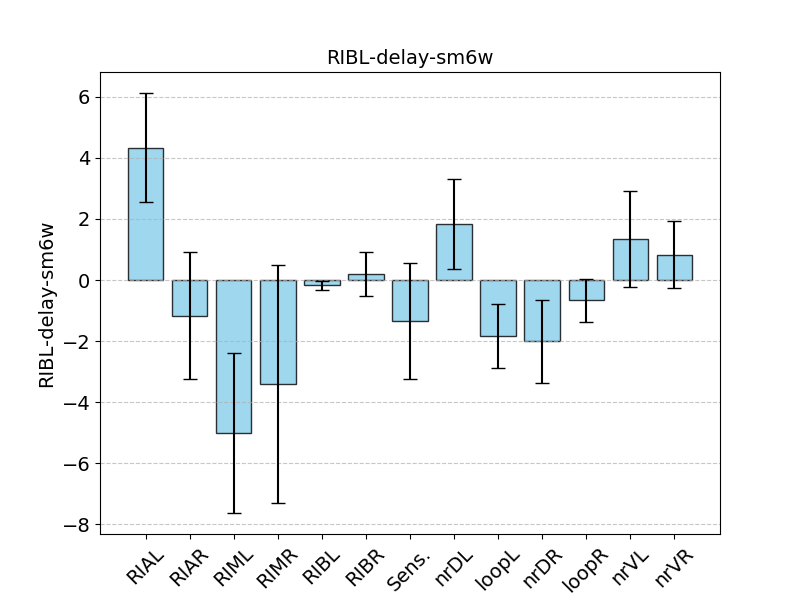

In [15]:
worms_to_select2 = [0,1,3,4,5,6] 
WormLabel_sub2 = [WormLabel[i] for i in worms_to_select2]
titre0 = Neur_lab[n2]+'-delay-sm-prom4-6w'
fig = Aut.plot_parameters_heat(peakMat[worms_to_select2,:],Neur_lab, WormLabel_sub2, paramName=Neur_lab[n2]+'-sm-normal',
                               fs = 20,titre = titre0)
fig.savefig(f"{outDir}delay_with_neu{n2}_ht.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_with_neu{n2}_ht.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(peakMat[worms_to_select2,:],Neur_lab, paramName=Neur_lab[n2]+'-delay-sm6w',fs = 14,r=45)
fig.savefig(f"{outDir}delay_with_neu{n2}_bar.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_with_neu{n2}_bar.png", dpi=res, bbox_inches='tight')

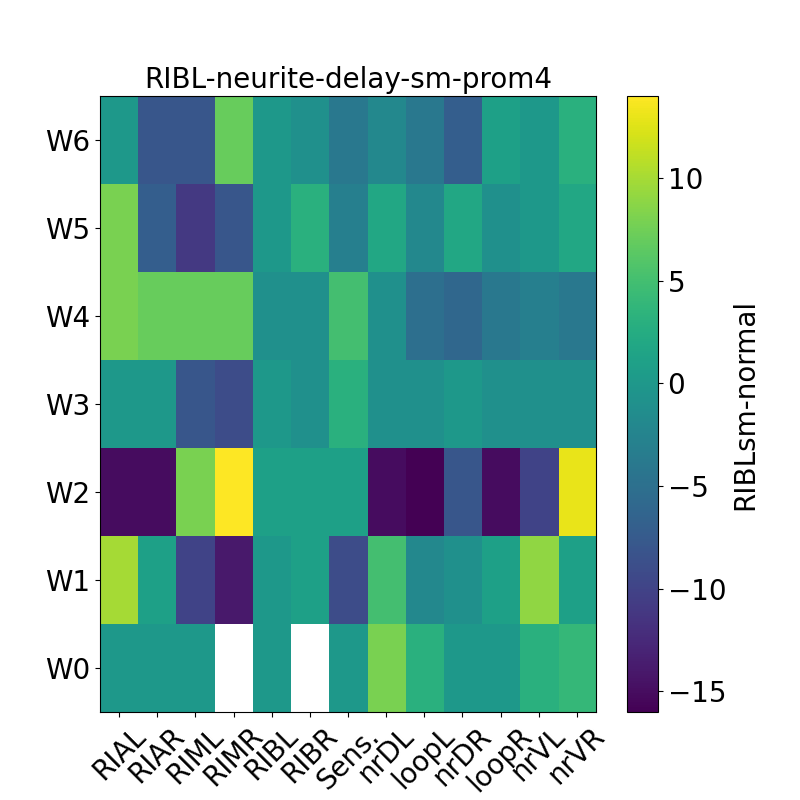

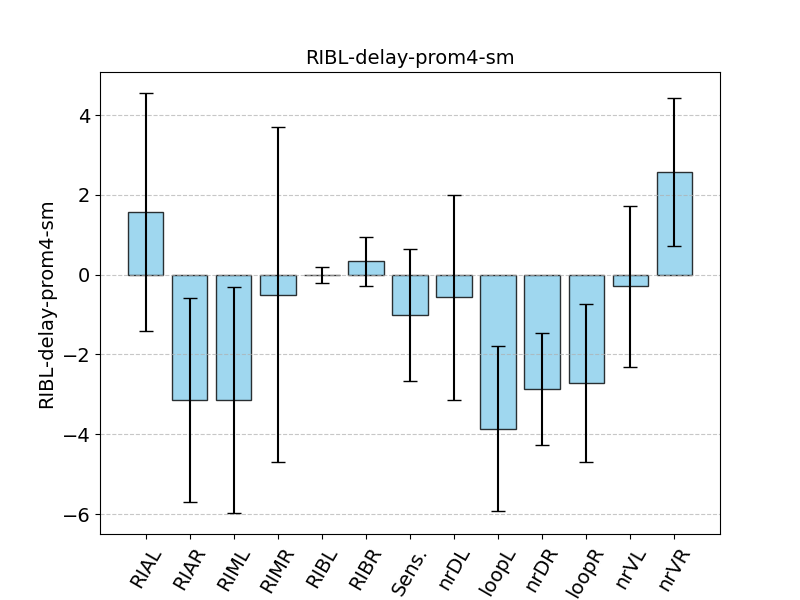

In [16]:
worms_to_select2 = [0,1,2,3,4,5,6] 
WormLabel_sub2 = [WormLabel[i] for i in worms_to_select2]
fig = Aut.plot_parameters_heat(peakMat[worms_to_select2,:],Neur_lab, WormLabel_sub2, paramName=Neur_lab[n2]+'sm-normal',
                         fs = 20,titre = 'RIBL-neurite-delay-sm-prom4')
fig = Aut.plot_parameters_bar(peakMat[worms_to_select2,:],Neur_lab, paramName=Neur_lab[n2]+'-delay-prom4-sm',fs = 14,r=60)

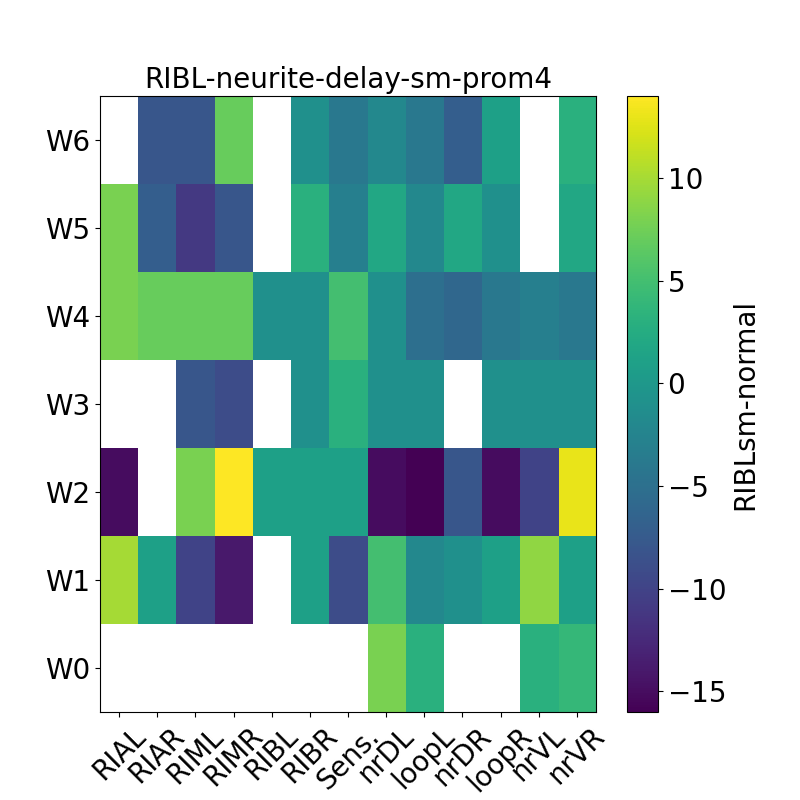

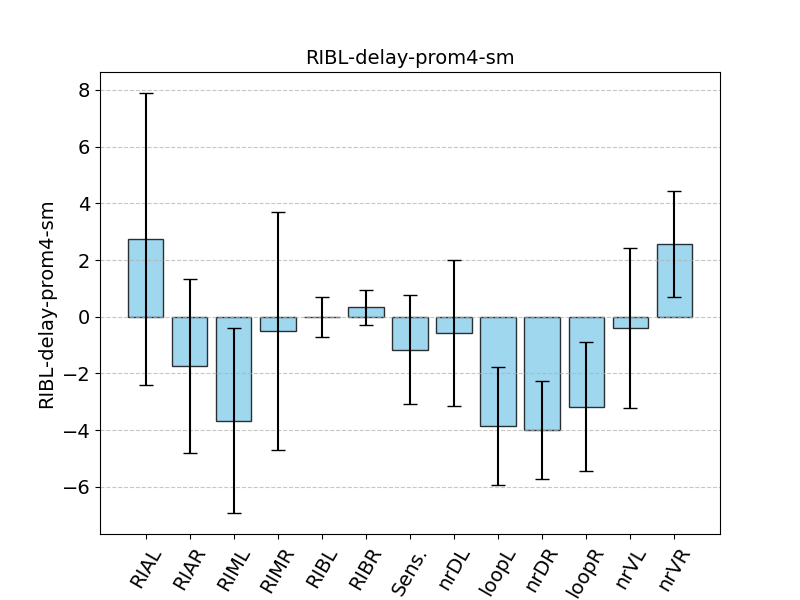

In [19]:
# plot average delays only when peak correlation is more than 0.2
peakMat[np.abs(peakMatWeight)<0.2] = np.nan
worms_to_select2 = [0,1,2,3,4,5,6] 
WormLabel_sub2 = [WormLabel[i] for i in worms_to_select2]
fig = Aut.plot_parameters_heat(peakMat[worms_to_select2,:],Neur_lab, WormLabel_sub2, paramName=Neur_lab[n2]+'sm-normal',
                         fs = 20,titre = 'RIBL-neurite-delay-sm-prom4')
fig = Aut.plot_parameters_bar(peakMat[worms_to_select2,:],Neur_lab, paramName=Neur_lab[n2]+'-delay-prom4-sm',fs = 14,r=60)

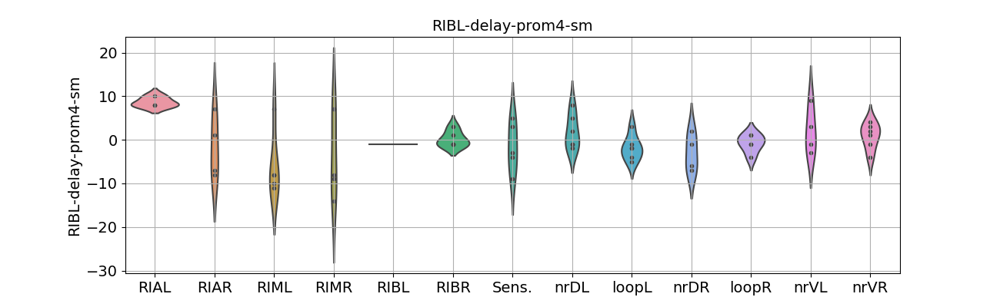

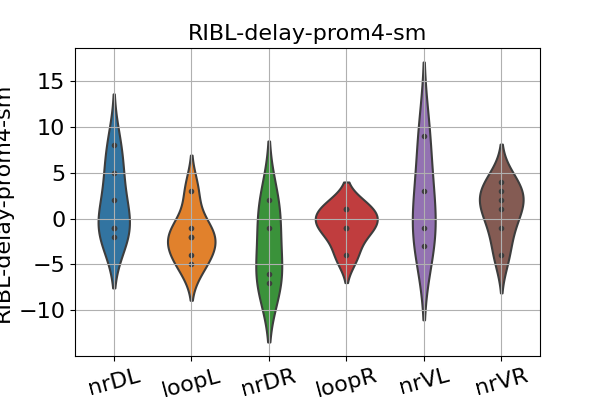

In [42]:
importlib.reload(Aut)
fig = Aut.plot_parameters_violin(peakMat[worms_to_select2,:],Neur_lab, paramName=Neur_lab[n2]+'-delay-prom4-sm',fs = 14)
fig = Aut.plot_parameters_violin(peakMat[worms_to_select2,7:],Neur_lab[7:], paramName=Neur_lab[n2]+'-delay-prom4-sm',fs = 16,r=15)
fig.savefig(f"{outDir}delay_neu{n2}_violin.png", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_neu{n2}_violin.pdf", dpi=res, bbox_inches='tight')

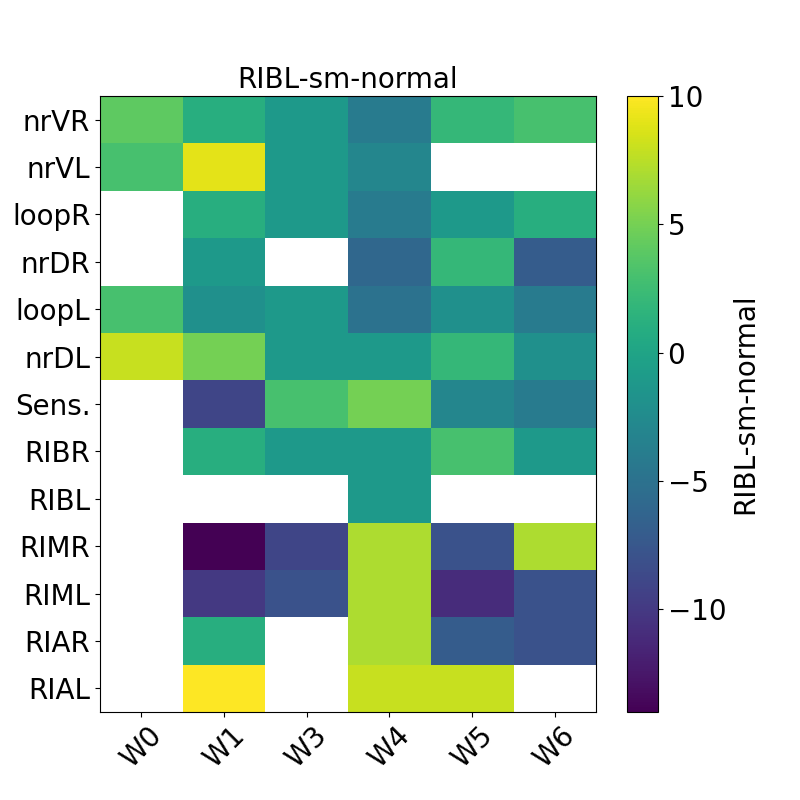

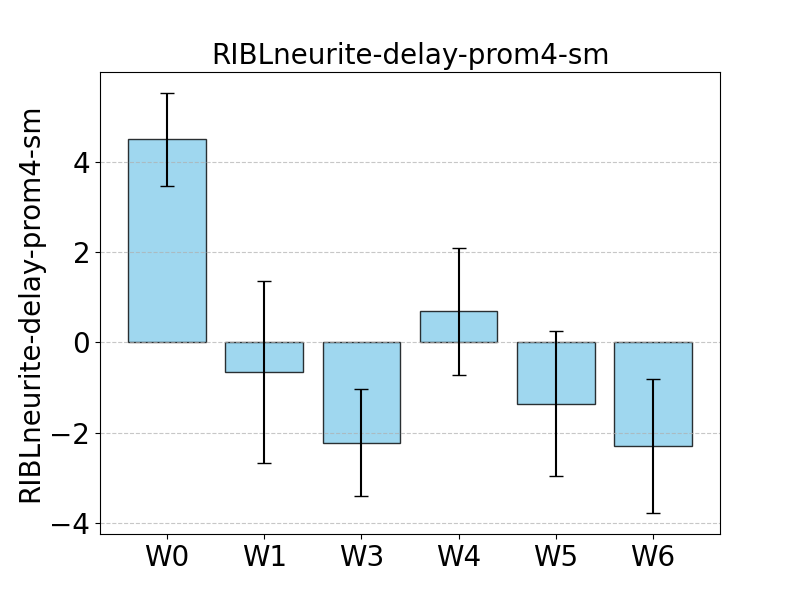

In [25]:
worms_to_select2 = [0,1,3,4,5,6] 
WormLabel_sub2 = [WormLabel[i] for i in worms_to_select2]
Aut.plot_parameters_heat(peakMat[worms_to_select2,:].transpose(), WormLabel_sub2,Neur_lab, paramName=Neur_lab[n2]+'-sm-normal',
                         fs = 20,titre = Neur_lab[n2]+'-sm-normal')
fig.savefig(f"{outDir}delay_neu{n2}_heat_worm.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_neu{n2}_heat_worm.png", dpi=res, bbox_inches='tight')

Aut.plot_parameters_bar(peakMat[worms_to_select2,:].transpose(), WormLabel_sub2,
                        paramName=Neur_lab[n2]+'neurite-delay-prom4-sm',fs = 20)

fig.savefig(f"{outDir}delay_neu{n2}_bar_worm.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_neu{n2}_bar_worm.png", dpi=res, bbox_inches='tight')

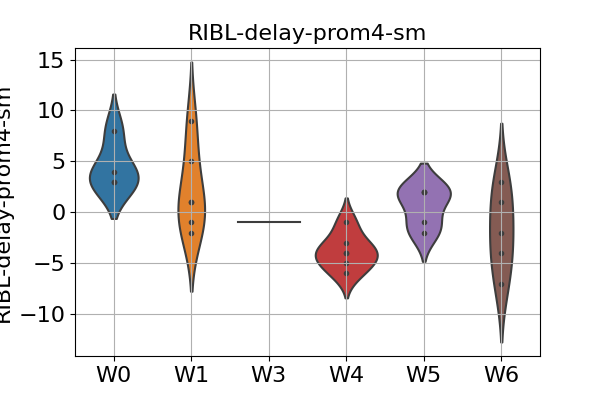

In [45]:
fig = Aut.plot_parameters_violin(peakMat[worms_to_select2,7:].transpose(), WormLabel_sub2, paramName=Neur_lab[n2]+'-delay-prom4-sm',fs = 16)
fig.savefig(f"{outDir}delay_neu{n2}_violin_worm.png", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_neu{n2}_violin_worm.pdf", dpi=res, bbox_inches='tight')


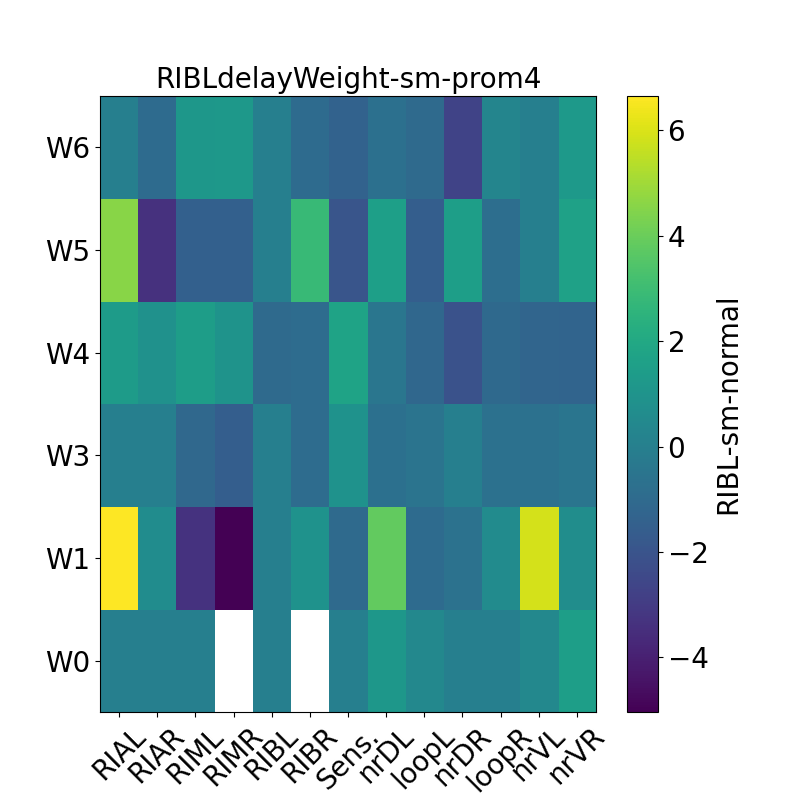

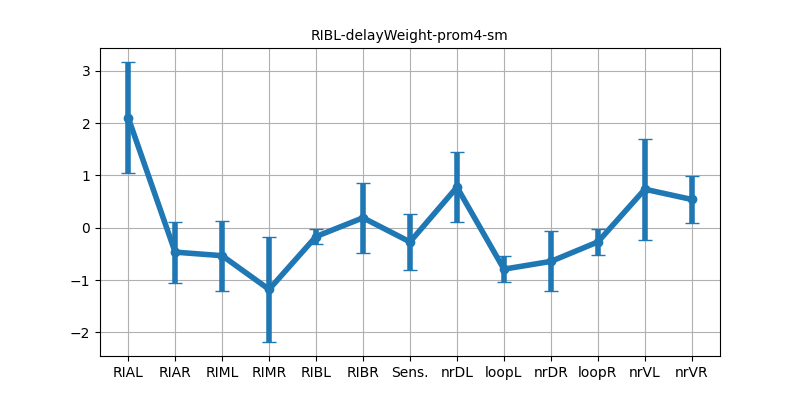

In [18]:
#plot weight of each neurons delay
worms_to_select2 = [0,1,3,4,5,6] 
WormLabel_sub2 = [WormLabel[i] for i in worms_to_select]
Aut.plot_parameters_heat(peakMatWeight[worms_to_select2,:],Neur_lab, WormLabel_sub2, paramName=Neur_lab[n2]+'-sm-normal',fs = 20,
                         titre = Neur_lab[n2]+'delayWeight-sm-prom4')
Aut.plot_parameters_errbar(peakMatWeight[worms_to_select2,:],Neur_lab, paramName= Neur_lab[n2]+'-delayWeight-prom4-sm',fs = 10)
fig.savefig(f"{outDir}delay_weight_neu{n2}_bar.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}delay_weight_neu{n2}_bar.png", dpi=res, bbox_inches='tight')

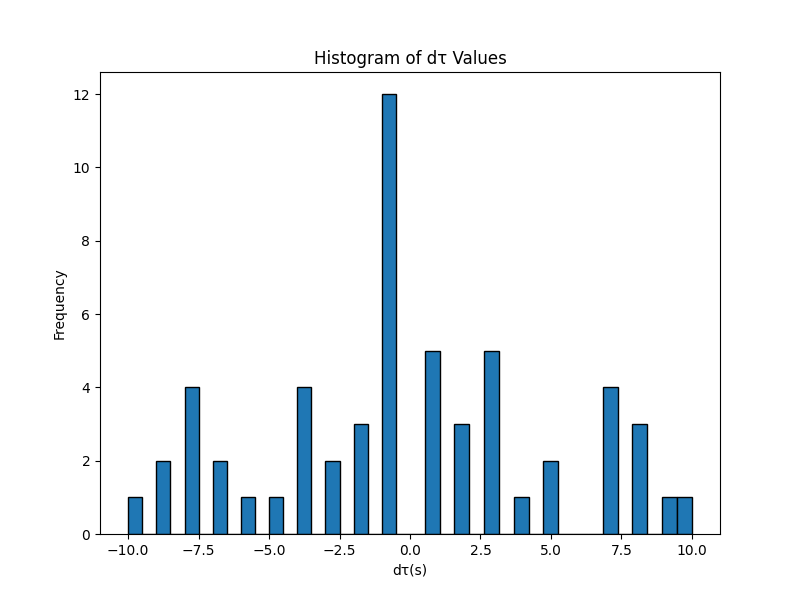

In [34]:
# plot histogram of delays
matrix = peakMat[worms_to_select2,:]
non_nan_values = matrix[~np.isnan(matrix)]
plt.figure(figsize=(8, 6))
#define explicit negative and positive bin edges
negative_values = non_nan_values[non_nan_values < 0]
positive_values = non_nan_values[non_nan_values > 0]
negative_bins = np.linspace(-10, 0, 20, endpoint=False)#
positive_bins = np.linspace(0, 10, 20)#
bins = np.concatenate((negative_bins, positive_bins))
####
plt.hist(non_nan_values, bins=bins, edgecolor='black')
plt.title("Histogram of dτ Values")
plt.xlabel("dτ(s)")
plt.ylabel("Frequency")
plt.show()

## Plot scatter plot of neurons activity with linear fit

/mnt/DATA/Mahsa/movies/LongRecordings/codes/Cluster/Functions/AllFunctions.py:334: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(vector[np.nonzero(vector)[0]])
/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/DATA/Mahsa/movies/LongRecordings/codes/Cluster/Functions/AllFunctions.py:334: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(vector[np.nonzero(vector)[0]])
/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


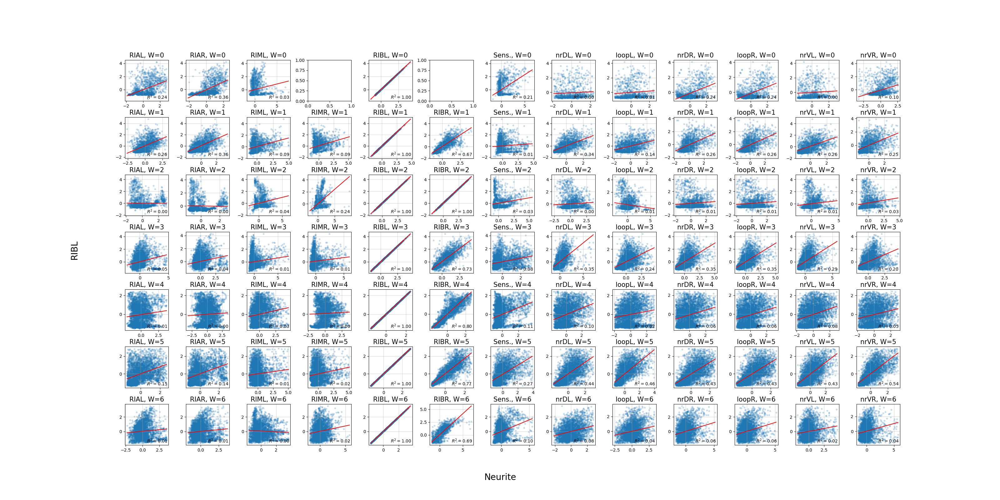

In [57]:

neuT = [0,1,2,3,4,5,6,7,8,27,27,39,40]#
fig, axes = plt.subplots(numW, len(neuT), figsize=(int(len(neuT)*2.5), 16))#, sharex=True)#, sharey=True)#, sharey=True)
fig.subplots_adjust(hspace=0.4, wspace=0.4)
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.',"nrDL","loopL","nrDR","loopR","nrVL","nrVR"]
datamat = copy.deepcopy(MegaData0)
m=4
for d in range(7):
    st = 0
    end = L[d]
    vec2= AllF.compute_vector_z_score(copy.deepcopy(datamat[d,st:end,m]))
    for n in range(len(neuT)):
        ax = axes[d, n] 
        neu = neuT[n]
        
        vec1= AllF.compute_vector_z_score(copy.deepcopy(datamat[d,st:end,neu]))
        nonzero_mask = (vec1 != 0) & (vec2 != 0)
        vec1_nonzero = vec1[nonzero_mask]
        if not hasattr(vec1_nonzero, 'reshape'):
            vec1_nonzero = vec1_nonzero.to_numpy().reshape(-1, 1)
        else:
            vec1_nonzero = vec1_nonzero.reshape(-1, 1)
            
        vec2_nonzero = vec2[nonzero_mask]
        if len(vec1_nonzero)>0:
            model = LinearRegression()
            model.fit(vec1_nonzero, vec2_nonzero)
            y_pred = model.predict(vec1_nonzero)
            r2 = r2_score(vec2_nonzero, y_pred)
    
            ax.scatter(vec1_nonzero, vec2_nonzero, label='Data points',s=10,alpha=0.2)
            x_line = np.linspace(vec1_nonzero.min(), vec1_nonzero.max(), 100).reshape(-1, 1)
            y_line = model.predict(x_line)
            ax.plot(x_line, y_line, color='red', label=f'Fit: $R^2 = {r2:.2f}$')
            ax.text(0.5, 0.05, f'$R^2 = {r2:.2f}$', transform=ax.transAxes, fontsize=10, color="black",zorder=3)
            ax.set_title(Neur_lab[n]+f", W={d}", fontsize=15)
            ax.grid(alpha=0.5)
            #lim = 20
            #ax.set_ylim(np.nanmin(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]), np.nanmax(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]*1.1))
            #ax.set_xlim(-lim, lim)
fig.text(0.5, 0.04, 'Neurite', ha='center', fontsize=20)
fig.text(0.07, 0.5, Neur_lab[m], va='center', rotation='vertical', fontsize=20)
fig.savefig(f"{outDir}allneurons_neu{m}_scatter.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}allneurons_neu{m}_scatter.png", dpi=res, bbox_inches='tight')

In [58]:
WormSet=[0,1,3,4,5,6]# the worms to depic in the plot
RIBset = [4,4,4,5,4,5]# the index of RIB neuron L/R
neur1=[27,7,7,7,28,40]# the indext of the neurite correlated with RIB
neur1Lab=["nrDR","nrDL","nrDL","nrDL","loopR","nrVR"]# neurite labels, should match neur1 indices
neur2=[40,40,27,0,40,0]
neur3=[0,27,28,0,7,0]
neur4=[27,7,7,7,7,7]# the indext of the neurite correlated with RIB
neur4Lab=["nrDR","nrDL","nrDL","nrDL","nrDL","nrDL"]# neurite labels, should match neur4 indices

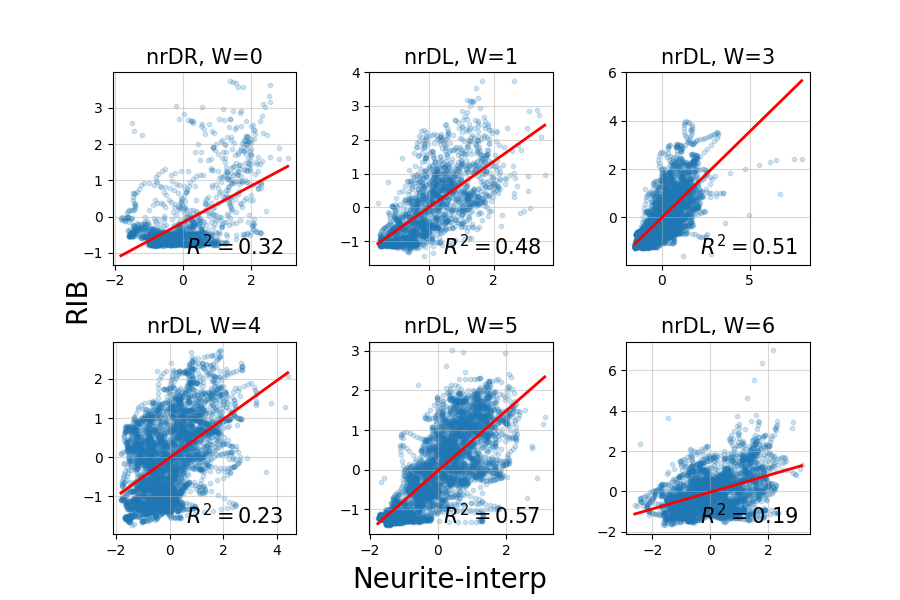

In [59]:
neuT = [6,7,8,27,28,39,40,5]#
fig, axes = plt.subplots(2, 3, figsize=(9, 6))#, sharey=True)#, sharey=True)
fig.subplots_adjust(hspace=0.4, wspace=0.4)
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.',"nrDL","loopL","nrDR","loopR","nrVL","nrVR","RIBR"]
datamat = copy.deepcopy(MegaData)

for i in range(6):
    d = int(WormSet[i])
    m =  int(RIBset[i])
    n =  int(neur4[i])
    st = 0
    end = L[d]
    vec2= AllF.compute_vector_z_score(copy.deepcopy(datamat[d,st:end,m]))
    ax = axes[i//3, i%3]  # Access the subplot
    # Extract data for current n and d
    
    
    vec1= AllF.compute_vector_z_score(copy.deepcopy(datamat[d,st:end,n]))
    nonzero_mask = (vec1 != 0) & (vec2 != 0)
    vec1_nonzero = vec1[nonzero_mask]
    if not hasattr(vec1_nonzero, 'reshape'):
        vec1_nonzero = vec1_nonzero.to_numpy().reshape(-1, 1)
    else:
        vec1_nonzero = vec1_nonzero.reshape(-1, 1)
    vec2_nonzero = vec2[nonzero_mask]
    model = LinearRegression()
    model.fit(vec1_nonzero, vec2_nonzero)
    y_pred = model.predict(vec1_nonzero)
    r2 = r2_score(vec2_nonzero, y_pred)

    ax.scatter(vec1_nonzero, vec2_nonzero, label='Data points',s=10,alpha=0.2)
    x_line = np.linspace(vec1_nonzero.min(), vec1_nonzero.max(), 100).reshape(-1, 1)
    y_line = model.predict(x_line)
    ax.plot(x_line, y_line, lw=2,color='red', label=f'Fit: $R^2 = {r2:.2f}$')
    ax.text(0.4, 0.05, f'$R^2 = {r2:.2f}$', transform=ax.transAxes, fontsize=15, color="black",zorder=3)
    ax.set_title(neur4Lab[i]+f", W={d}", fontsize=15)
    ax.grid(alpha=0.5)
    #lim = 20
    #ax.set_ylim(np.nanmin(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]), np.nanmax(FullAutocorr[d,L[d]-lim*2:L[d]+lim*2,n]*1.1))
    #ax.set_xlim(-lim, lim)
fig.text(0.5, 0.02, 'Neurite-interp', ha='center', fontsize=20)
fig.text(0.07, 0.5, 'RIB', va='center', rotation='vertical', fontsize=20)
fig.savefig(f"{outDir}RIB_neurite_fit.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}RIB_neurite_fit.png", dpi=res, bbox_inches='tight')